In [2]:
import pandas as pd
import numpy as np
import seaborn as sb

In [3]:
data = pd.read_csv("used_device_data.csv")
data

,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
0,Honor,Android,14.50,yes,no,13.0,5.0,64.0,3.0,3020.0,146.0,2020,127,4.307572,4.715100
1,Honor,Android,17.30,yes,yes,13.0,16.0,128.0,8.0,4300.0,213.0,2020,325,5.162097,5.519018
2,Honor,Android,16.69,yes,yes,13.0,8.0,128.0,8.0,4200.0,213.0,2020,162,5.111084,5.884631
3,Honor,Android,25.50,yes,yes,13.0,8.0,64.0,6.0,7250.0,480.0,2020,345,5.135387,5.630961
4,Honor,Android,15.32,yes,no,13.0,8.0,64.0,3.0,5000.0,185.0,2020,293,4.389995,4.947837
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3449,Asus,Android,15.34,yes,no,NaN,8.0,64.0,6.0,5000.0,190.0,2019,232,4.492337,6.483872
3450,Asus,Android,15.24,yes,no,13.0,8.0,128.0,8.0,4000.0,200.0,2018,541,5.037732,6.251538
3451,Alcatel,Android,15.80,yes,no,13.0,5.0,32.0,3.0,4000.0,165.0,2020,201,4.357350,4.528829
3452,Alcatel,Android,15.80,yes,no,13.0,5.0,32.0,2.0,4000.0,160.0,2020,149,4.349762,4.624188


<AxesSubplot:xlabel='rear_camera_mp', ylabel='Density'>

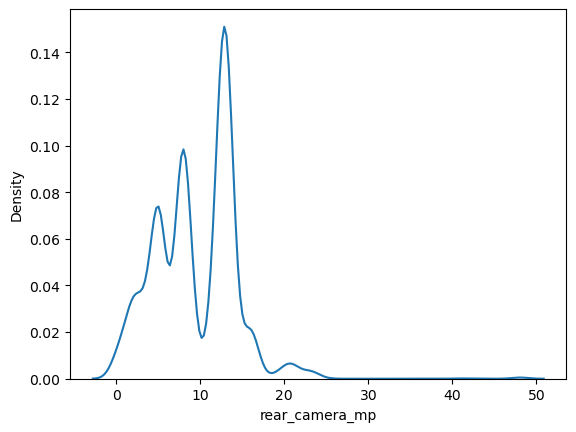

In [4]:
# Density plot of the rear camera mp
sb.kdeplot(data=data, x='rear_camera_mp')

In [5]:
# Measuring the skewness to determine if we should remove the NULL values
# Since the skew is close to 0 we can safely remove the NULL values as it is close to a normal distribution
data['rear_camera_mp'].astype(float).skew()

0.7655057967745678

In [6]:
# Finding percentage of missing values in the data
# Since the number of data that is not found is a small proportion of the total data, removing them will not significantly
# affect the accuracy of the model.
missingValues = data.isnull().sum()

rearCameraMissing = data['rear_camera_mp'].isnull().sum()
frontCameraMissing = data['front_camera_mp'].isnull().sum()
internalMemMissing = data['internal_memory'].isnull().sum()
ramMissing = data['ram'].isnull().sum()
battMissing = data['battery'].isnull().sum()
weightMissing = data['weight'].isnull().sum()

rearCamMissPercent = (rearCameraMissing/len(data['rear_camera_mp']))*100
frontCamMissPercent = (frontCameraMissing/len(data['front_camera_mp']))*100
internalMemMissPercent = (internalMemMissing/len(data['internal_memory']))*100
ramMissPercent = (ramMissing/len(data['ram']))*100
battMissPercent = (battMissing/len(data['battery']))*100
weightMissPercent = (weightMissing/len(data['weight']))*100

print("Percentage of rear camera missing: ", rearCamMissPercent, "%")
print("Percentage of front camera missing: ", frontCamMissPercent, "%")
print("Percentage of internal memory missing: ", internalMemMissPercent, "%")
print("Percentage of ram missing: ", ramMissPercent, "%")
print("Percentage of battery missing: ", battMissPercent, "%")
print("Percentage of weight missing: ", weightMissPercent, "%")

Percentage of rear camera missing:  5.182397220613781 %
Percentage of front camera missing:  0.05790387955993051 %
Percentage of internal memory missing:  0.11580775911986102 %
Percentage of ram missing:  0.11580775911986102 %
Percentage of battery missing:  0.17371163867979156 %
Percentage of weight missing:  0.2026635784597568 %


<AxesSubplot:>

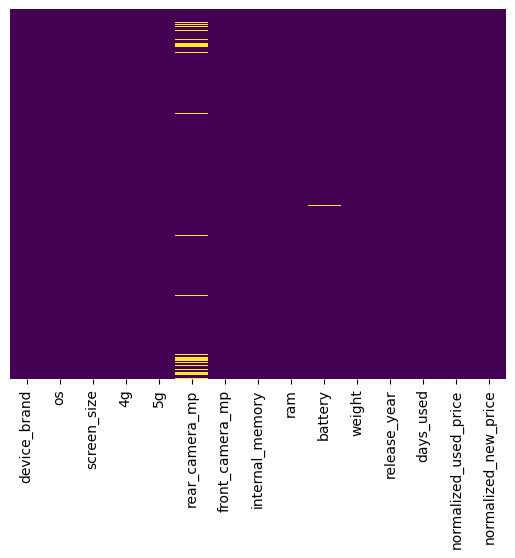

In [7]:
# Visualizing the dataset with missing data
sb.heatmap(data.isnull(),yticklabels=False,cbar=False,cmap='viridis')

<AxesSubplot:>

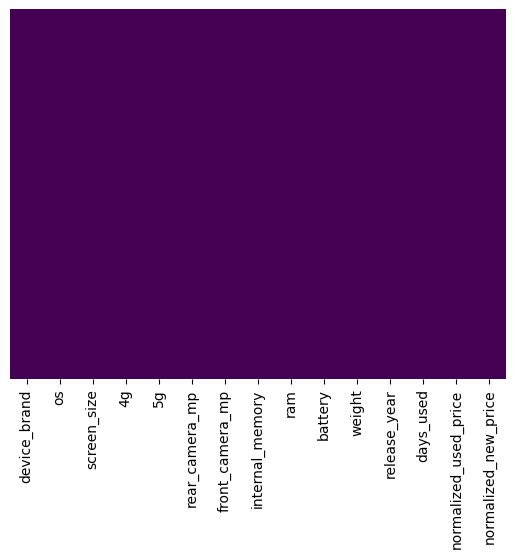

In [8]:
# Visualizing the dataset after removing the missing data
data = data.dropna()
sb.heatmap(data.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [9]:
# Checking for duplicate values
data.duplicated().sum()

0

In [10]:
data

,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
0,Honor,Android,14.50,yes,no,13.0,5.0,64.0,3.0,3020.0,146.0,2020,127,4.307572,4.715100
1,Honor,Android,17.30,yes,yes,13.0,16.0,128.0,8.0,4300.0,213.0,2020,325,5.162097,5.519018
2,Honor,Android,16.69,yes,yes,13.0,8.0,128.0,8.0,4200.0,213.0,2020,162,5.111084,5.884631
3,Honor,Android,25.50,yes,yes,13.0,8.0,64.0,6.0,7250.0,480.0,2020,345,5.135387,5.630961
4,Honor,Android,15.32,yes,no,13.0,8.0,64.0,3.0,5000.0,185.0,2020,293,4.389995,4.947837
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3447,Apple,iOS,15.27,yes,no,8.0,7.0,64.0,4.0,3110.0,194.0,2019,208,5.100902,6.287933
3450,Asus,Android,15.24,yes,no,13.0,8.0,128.0,8.0,4000.0,200.0,2018,541,5.037732,6.251538
3451,Alcatel,Android,15.80,yes,no,13.0,5.0,32.0,3.0,4000.0,165.0,2020,201,4.357350,4.528829
3452,Alcatel,Android,15.80,yes,no,13.0,5.0,32.0,2.0,4000.0,160.0,2020,149,4.349762,4.624188


In [11]:
# Encoding the categorical data into a binary form for ease of data processing
data['4g'] = data['4g'].map({'yes':1,'no':0})
data['5g'] = data['5g'].map({'yes':1,'no':0})

/var/folders/bz/c6cjdm8d3l77xx0231r4r70w0000gn/T/ipykernel_85379/3529468325.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['4g'] = data['4g'].map({'yes':1,'no':0})
/var/folders/bz/c6cjdm8d3l77xx0231r4r70w0000gn/T/ipykernel_85379/3529468325.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['5g'] = data['5g'].map({'yes':1,'no':0})


# Performing EDA on the data

<AxesSubplot:xlabel='4g', ylabel='normalized_used_price'>

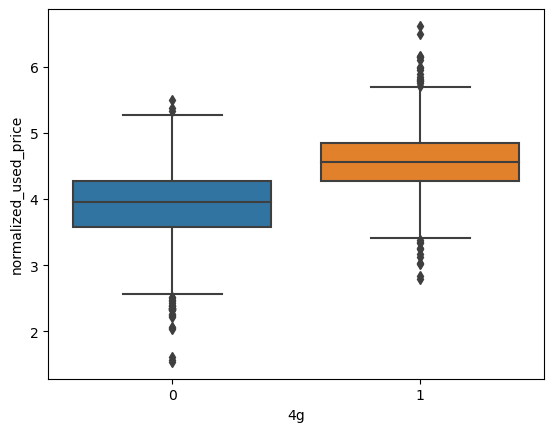

In [12]:
# Plotting the categorical data against normalised used price
sb.boxplot(data=data, x='4g', y=data['normalized_used_price'])

<AxesSubplot:xlabel='5g', ylabel='normalized_used_price'>

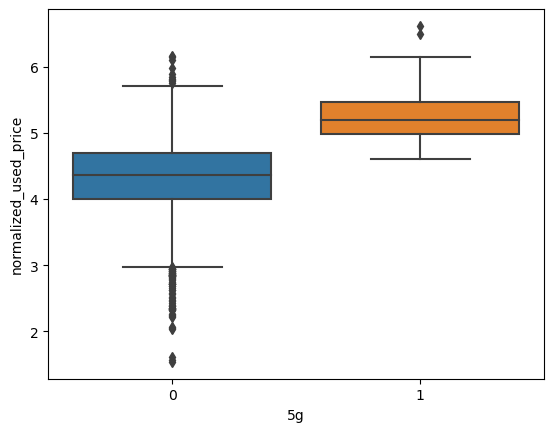

In [13]:
sb.boxplot(data=data, x='5g', y=data['normalized_used_price'])

### As seen above there is a clear difference between the boxplots of the 5g vs no 5g or 4g vs no 4g. This implies that 4g and 5g data can be used as predictors for predicting the trend of used phone price.

## Plotting Pairplot to investigate non-linear relationships, as well as possible clustering of data


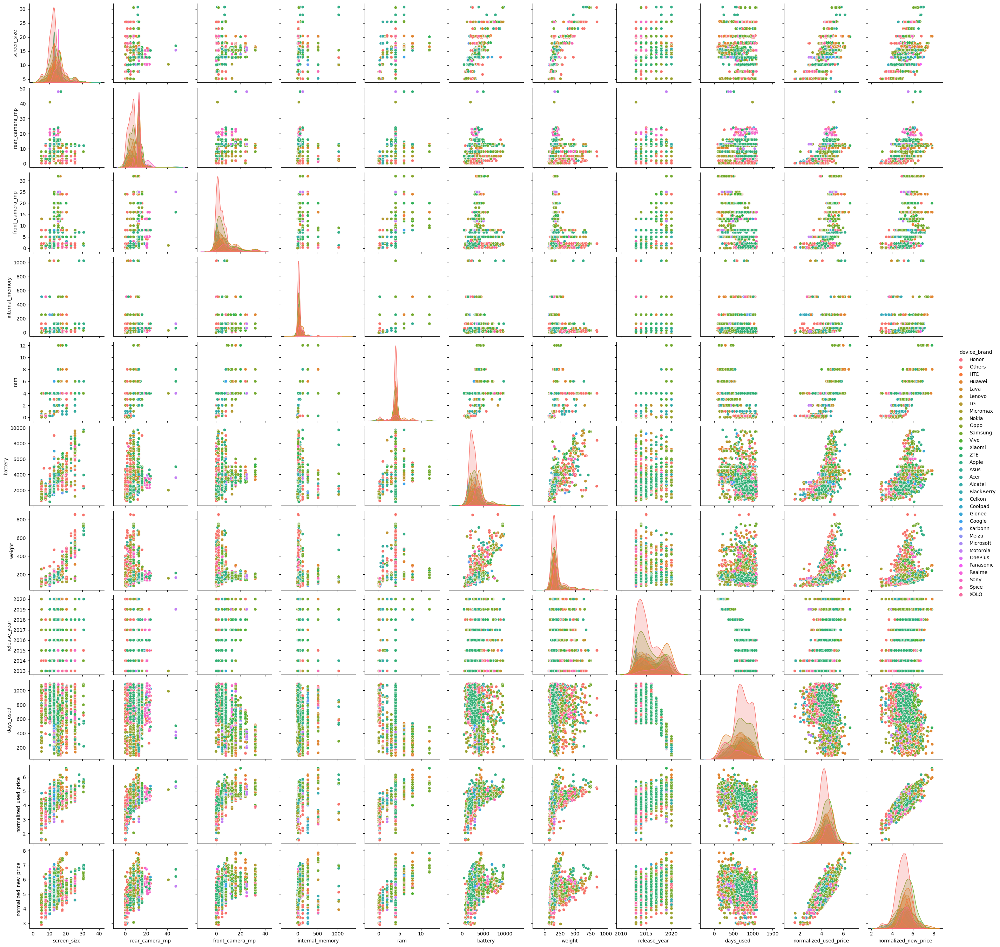

In [14]:
pairplotData = data.drop(columns=['4g', '5g'])
sb.pairplot(data=pairplotData, hue='device_brand')

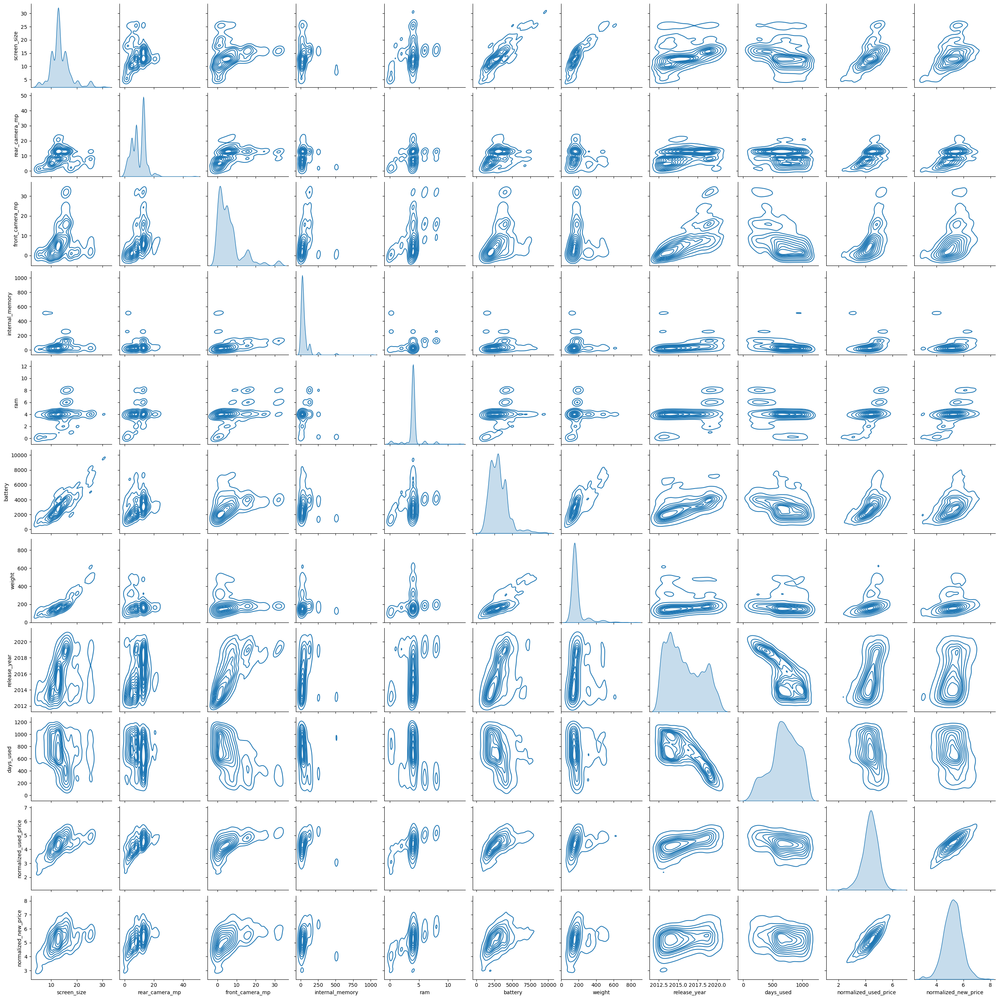

In [15]:
pairplotData = data.drop(columns=['4g', '5g'])
sb.pairplot(data=pairplotData, kind='kde')

### As seen in the hue of the pairplots, the screen size could be used as a predictor in predicting the normalized used price, since the data seems to be segregated into clusters of similar screen size and similar normalized used price. Perhaps we can use it to determine if the phones are "expensive". Though that requires some more definitions

### Weight and battery can be studied together with screen size to give a prediction on the price range of the used phones

### Days used and rear camera mp can also be used together to determine the price range of the used phones. The same can be observed with front camera mp as well

### Release year and days used can also be used together as well

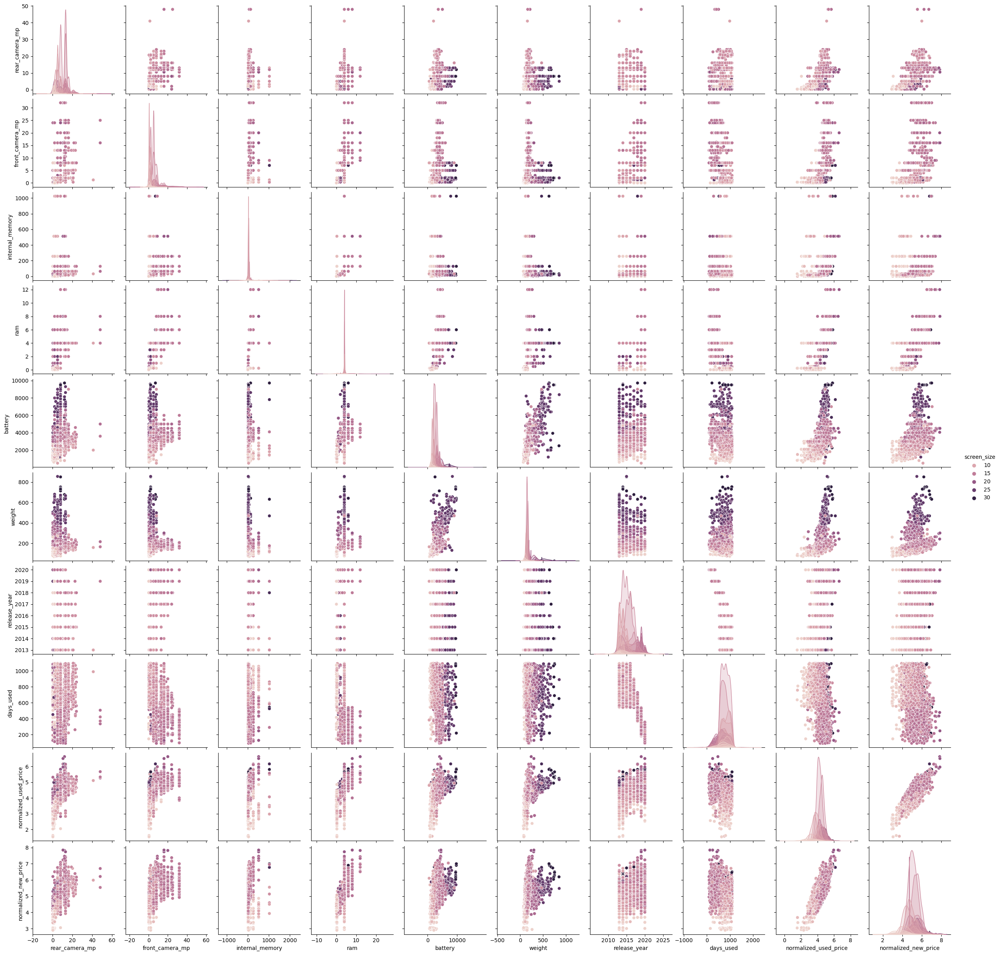

In [16]:
sb.pairplot(data=pairplotData, hue='screen_size')

## Performing other EDA to find out more relationships

<AxesSubplot:xlabel='normalized_used_price', ylabel='device_brand'>

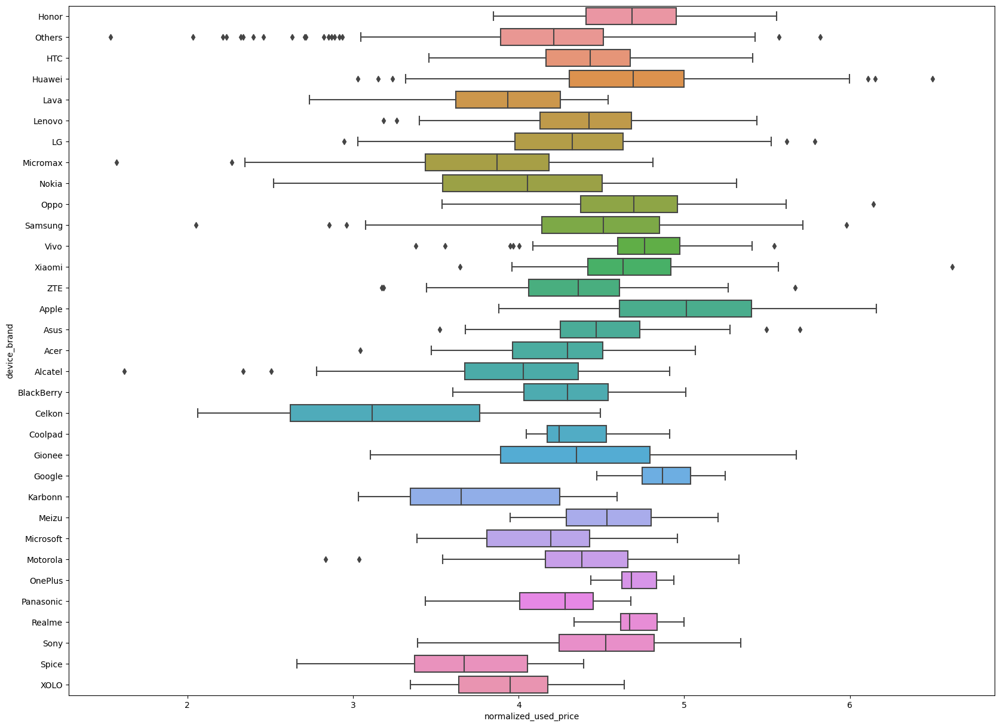

In [43]:
plt.figure(figsize = (20, 15))
sb.boxplot(x="normalized_used_price", y="device_brand", data=data)

<AxesSubplot:xlabel='ram', ylabel='normalized_used_price'>

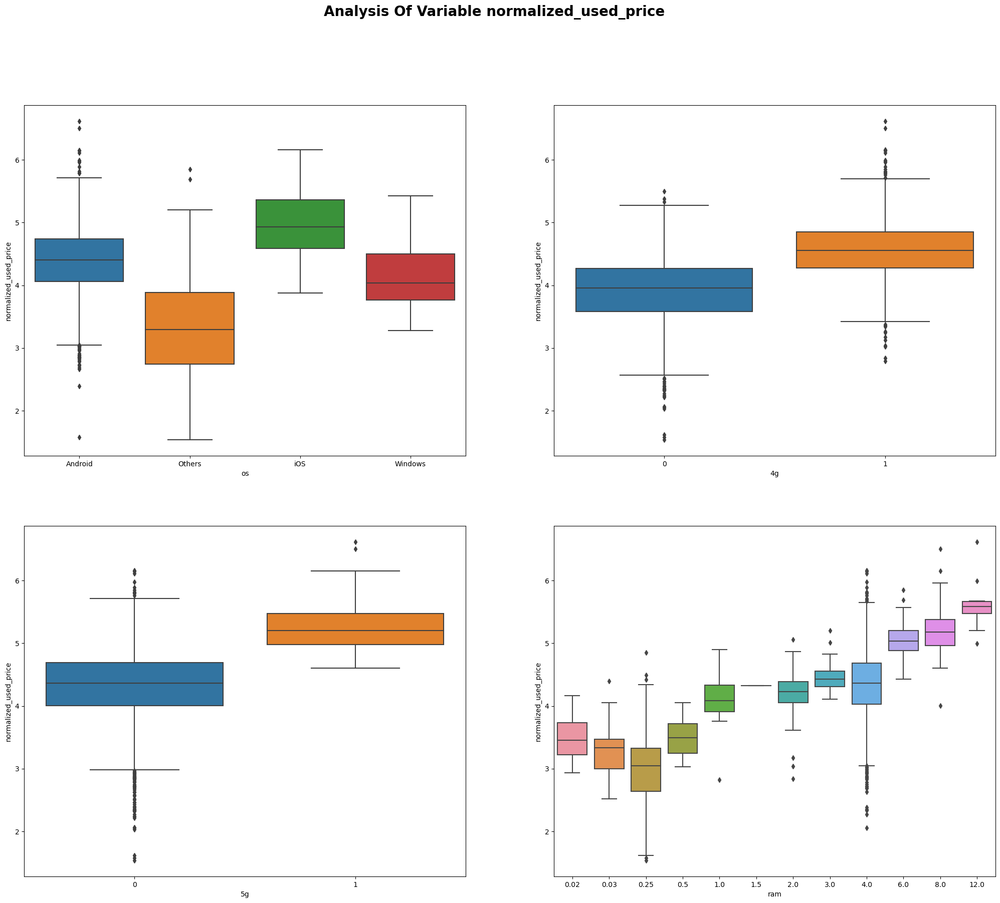

In [45]:
plt.figure(figsize = (25, 20))
plt.suptitle("Analysis Of Variable normalized_used_price",fontweight="bold", fontsize=20)

plt.subplot(2,2,1)
sb.boxplot(x="os", y="normalized_used_price", data=data)

plt.subplot(2,2,2)
sb.boxplot(x="4g", y="normalized_used_price", data=data)

plt.subplot(2,2,3)
sb.boxplot(x="5g", y="normalized_used_price", data=data)

plt.subplot(2,2,4)
sb.boxplot(x="ram", y="normalized_used_price", data=data)

### Here we can see that screen size has a linear relationship with used phone price. However, It has to be noted that screen size is actually a categorical variable. 

<AxesSubplot:xlabel='screen_size', ylabel='normalized_used_price'>

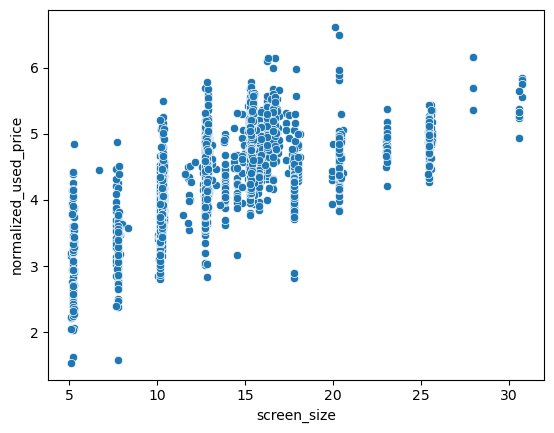

In [47]:
sb.scatterplot(data=data, x="screen_size", y="normalized_used_price")

### The same behaviour can also be observed with the screen size variable

<AxesSubplot:xlabel='rear_camera_mp', ylabel='normalized_used_price'>

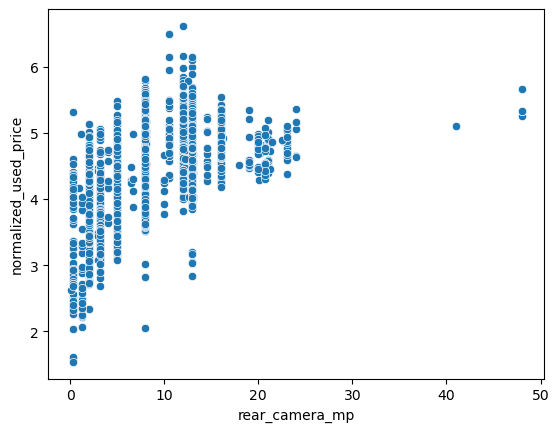

In [48]:
sb.scatterplot(data=data, x="rear_camera_mp", y="normalized_used_price")

### For days used there is a strong relationship to the used price

<AxesSubplot:xlabel='days_used', ylabel='normalized_used_price'>

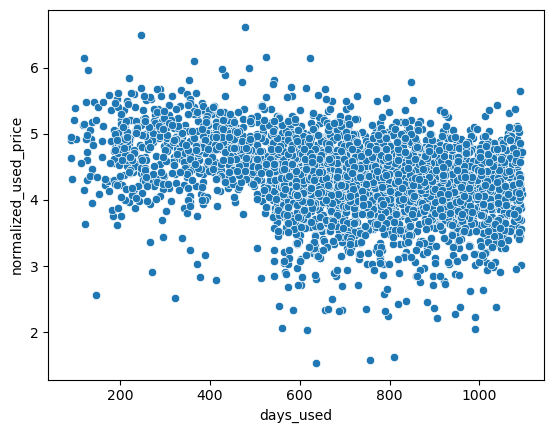

In [49]:
sb.scatterplot(data=data, x="days_used", y="normalized_used_price")

## What we can see from the EDA above is that some variables though numeric are categorica in nature, such as screen size. For such cases we could use a classifier to predict if the phones will be expensive or not. 

## Other variables are continous and can be used to predict the phone price using standard linear regression models. 

## Linear Regression with outliers as well as with R^2 and MSE

Intercept of Regression 	: b =  [0.61726637]
Coefficients of Regression 	: a =  [[0.71453821]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.6843966659831267
Mean Squared Error (MSE) 	: 0.10354069324862929

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.7177986924028684
Mean Squared Error (MSE) 	: 0.10302764574947294

Skewness of data:  -0.519105480790038


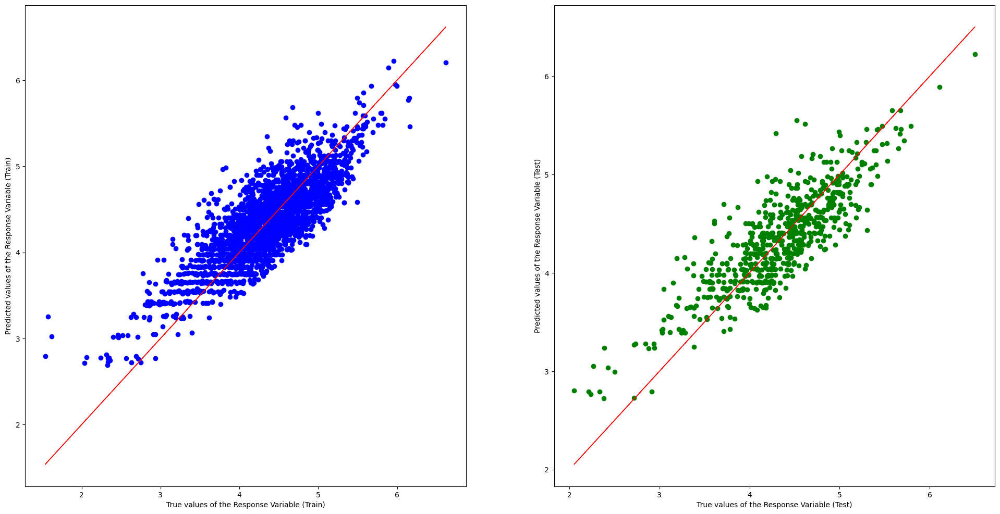

In [28]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Recall the Total-HP Dataset
normUsedPrice = pd.DataFrame(pd.DataFrame(data['normalized_used_price']))   # Response
newPrice = pd.DataFrame(pd.DataFrame(data['normalized_new_price']))         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(newPrice, normUsedPrice, test_size = 0.2)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Checking skewness of data
print("Skewness of data: ", data['normalized_used_price'].skew())

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")

axes[0].plot(y_train.squeeze(), y_train.squeeze(), 'r-', linewidth = 1)

axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")

axes[1].plot(y_test.squeeze(), y_test.squeeze(), 'r-', linewidth = 1)
# 
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

<AxesSubplot:xlabel='normalized_used_price', ylabel='Density'>

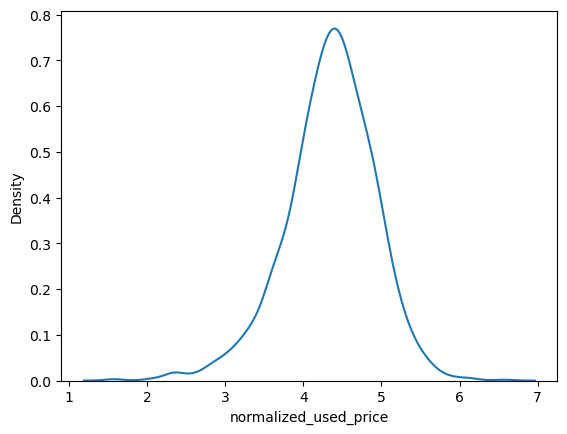

In [29]:
sb.kdeplot(data=data['normalized_used_price'])

Intercept of Regression 	: b =  [3.4949446]
Coefficients of Regression 	: a =  [[0.00027272]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.36700724947847574
Mean Squared Error (MSE) 	: 0.21693426165106522

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.3856314626111904
Mean Squared Error (MSE) 	: 0.18789452084522304



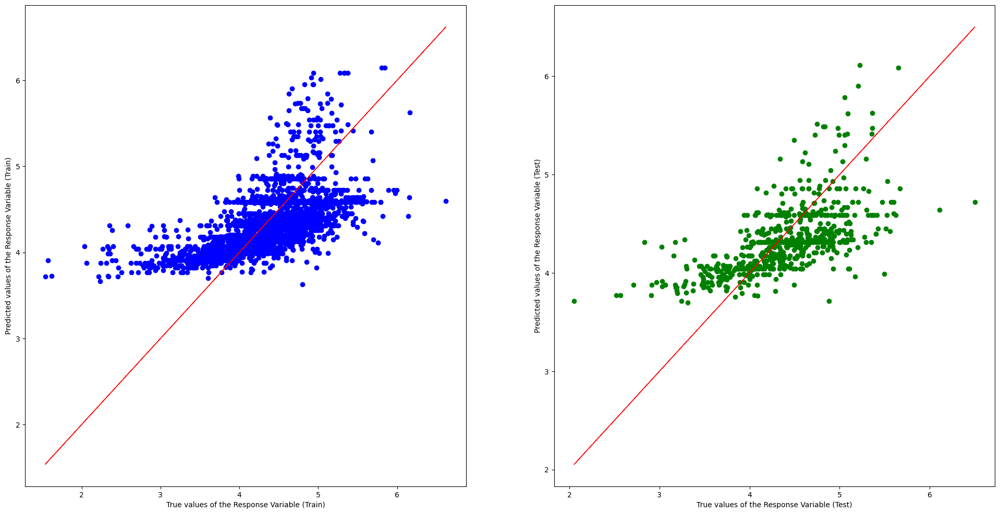

In [30]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Recall the Total-HP Dataset
normUsedPrice = pd.DataFrame(pd.DataFrame(data['normalized_used_price']))   # Response
battery = pd.DataFrame(pd.DataFrame(data['battery']))         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(battery, normUsedPrice, test_size = 0.2)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")

axes[0].plot(y_train.squeeze(), y_train.squeeze(), 'r-', linewidth = 1)

axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")

axes[1].plot(y_test.squeeze(), y_test.squeeze(), 'r-', linewidth = 1)
# 
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

Intercept of Regression 	: b =  [3.12452576]
Coefficients of Regression 	: a =  [[0.08991708]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.35780524774221545
Mean Squared Error (MSE) 	: 0.21055213199713993

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.409116715731238
Mean Squared Error (MSE) 	: 0.21580750552413974



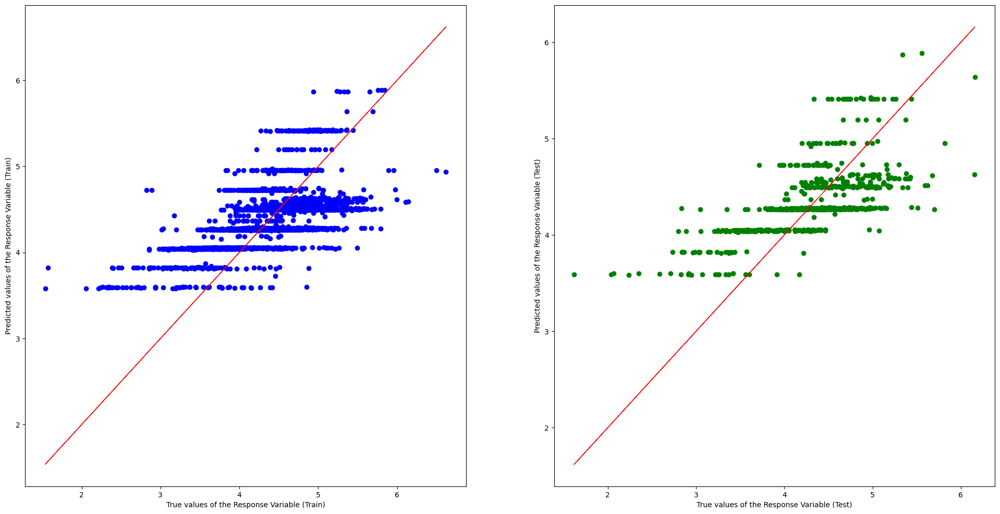

In [31]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Recall the Total-HP Dataset
normUsedPrice = pd.DataFrame(pd.DataFrame(data['normalized_used_price']))   # Response
screenSize = pd.DataFrame(pd.DataFrame(data['screen_size']))         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(screenSize, normUsedPrice, test_size = 0.2)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")

axes[0].plot(y_train.squeeze(), y_train.squeeze(), 'r-', linewidth = 1)

axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")

axes[1].plot(y_test.squeeze(), y_test.squeeze(), 'r-', linewidth = 1)
# 
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

Intercept of Regression 	: b =  [3.67350906]
Coefficients of Regression 	: a =  [[0.07071135]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.3414658656786874
Mean Squared Error (MSE) 	: 0.22226442599807003

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.3407527090692676
Mean Squared Error (MSE) 	: 0.21591555567291368



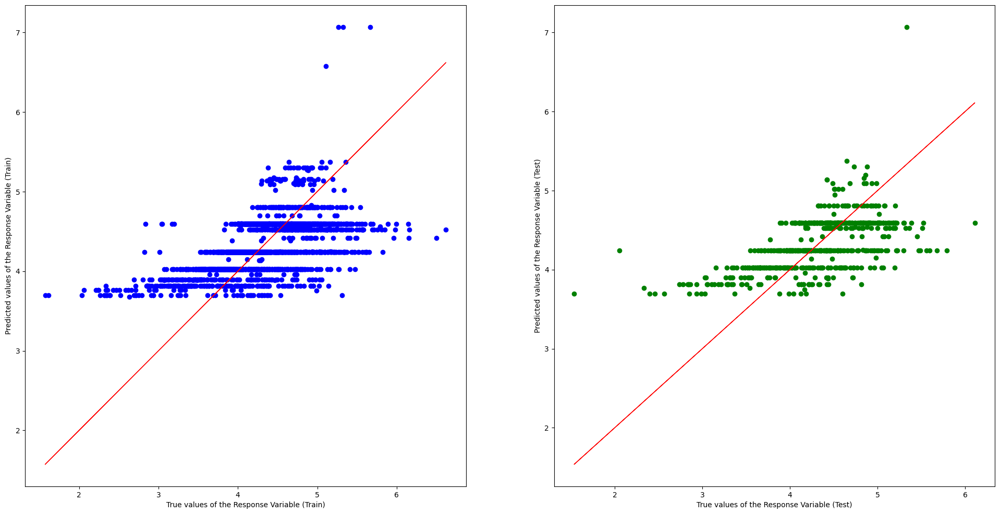

In [32]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Recall the Total-HP Dataset
normUsedPrice = pd.DataFrame(pd.DataFrame(data['normalized_used_price']))   # Response
rearCameraMP = pd.DataFrame(pd.DataFrame(data['rear_camera_mp']))         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(rearCameraMP, normUsedPrice, test_size = 0.2)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")

axes[0].plot(y_train.squeeze(), y_train.squeeze(), 'r-', linewidth = 1)

axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")

axes[1].plot(y_test.squeeze(), y_test.squeeze(), 'r-', linewidth = 1)
# 
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

Intercept of Regression 	: b =  [4.04200445]
Coefficients of Regression 	: a =  [[0.05099094]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.33889302736189153
Mean Squared Error (MSE) 	: 0.21719185737351307

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.37568192234341624
Mean Squared Error (MSE) 	: 0.2262233648129444



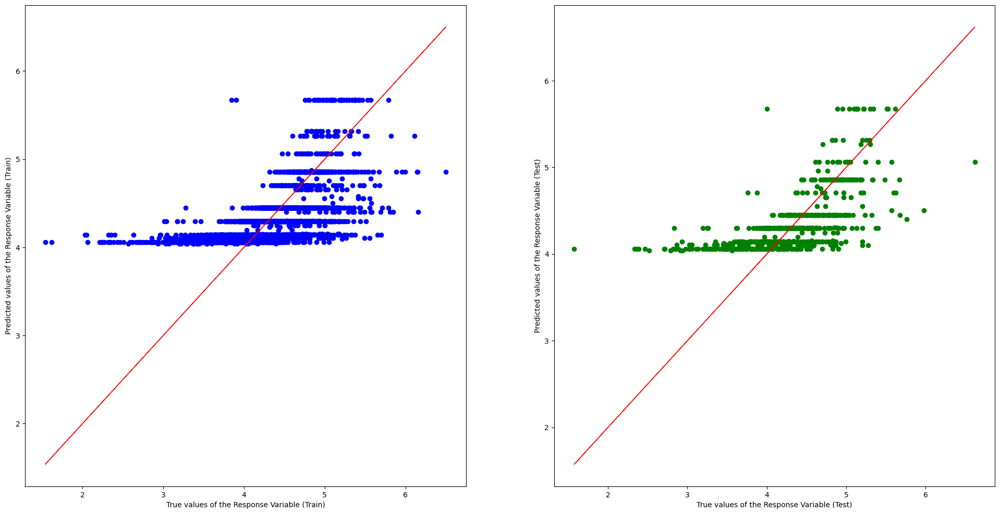

In [33]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Recall the Total-HP Dataset
normUsedPrice = pd.DataFrame(pd.DataFrame(data['normalized_used_price']))   # Response
frontCameraMP = pd.DataFrame(pd.DataFrame(data['front_camera_mp']))         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(frontCameraMP, normUsedPrice, test_size = 0.2)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")

axes[0].plot(y_train.squeeze(), y_train.squeeze(), 'r-', linewidth = 1)

axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")

axes[1].plot(y_test.squeeze(), y_test.squeeze(), 'r-', linewidth = 1)
# 
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Implementing K Mean clustering


In [34]:
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.cluster import KMeans

continuousData = data.drop(columns=['4g', '5g', 'os', 'device_brand'])

In [35]:
# standardizing the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(continuousData)

# statistics of scaled data
pd.DataFrame(data_scaled).describe()

,0,1,2,3,4,5,6,7,8,9,10
count,3.253000e+03,3.253000e+03,3.253000e+03,3.253000e+03,3.253000e+03,3.253000e+03,3.253000e+03,3.253000e+03,3.253000e+03,3.253000e+03,3.253000e+03
mean,6.179860e-16,-7.936405e-16,1.220768e-15,-1.473290e-15,4.279120e-15,1.680522e-16,-2.429146e-17,4.848245e-14,-1.706460e-16,-5.725174e-16,-7.829240e-17
std,1.000154e+00,1.000154e+00,1.000154e+00,1.000154e+00,1.000154e+00,1.000154e+00,1.000154e+00,1.000154e+00,1.000154e+00,1.000154e+00,1.000154e+00
min,-2.216992e+00,-1.956978e+00,-9.235023e-01,-6.097293e-01,-3.216888e+00,-1.985665e+00,-1.256212e+00,-1.264694e+00,-2.568604e+00,-4.842737e+00,-3.448396e+00
25%,-2.382481e-01,-9.322899e-01,-6.204061e-01,-4.225566e-01,3.021903e-02,-7.518186e-01,-4.653629e-01,-8.075266e-01,-5.594110e-01,-5.577595e-01,-6.378232e-01
50%,-2.044900e-01,-3.074802e-01,-1.657618e-01,-2.352668e-01,3.021903e-02,-5.778023e-02,-2.711095e-01,-3.503592e-01,3.952394e-02,6.085754e-02,3.672866e-02
75%,4.421074e-01,7.338695e-01,2.888824e-01,1.393128e-01,3.021903e-02,6.748158e-01,-5.463851e-03,1.021143e+00,7.786351e-01,6.615123e-01,6.260891e-01
max,4.438547e+00,8.023317e+00,3.926037e+00,1.137670e+01,6.557068e+00,5.124373e+00,7.443683e+00,1.935478e+00,1.691905e+00,3.930518e+00,3.916128e+00


In [36]:
# defining the kmeans function with initialization as k-means++
kmeans = KMeans(n_clusters=2, init='k-means++')

# fitting the k means algorithm on scaled data
kmeans.fit(data_scaled)

KMeans(n_clusters=2)

In [37]:
# inertia on the fitted data
kmeans.inertia_

26122.003507557114

Text(0, 0.5, 'Inertia')

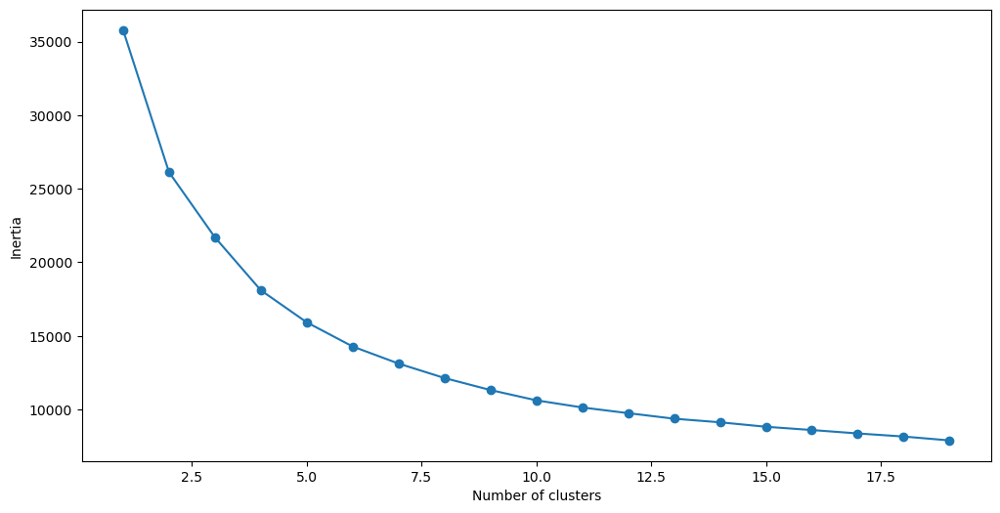

In [38]:
# fitting multiple k-means algorithms and storing the values in an empty list
SSE = []
for cluster in range(1,20):
    kmeans = KMeans(n_clusters = cluster, init='k-means++')
    kmeans.fit(data_scaled)
    SSE.append(kmeans.inertia_)

# converting the results into a dataframe and plotting them
frame = pd.DataFrame({'Cluster':range(1,20), 'SSE':SSE})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['SSE'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [39]:
# k means using 5 clusters and k-means++ initialization
kmeans = KMeans(n_clusters = 5, init='k-means++')
kmeans.fit(data_scaled)
pred = kmeans.predict(data_scaled)

#predict the labels of clusters.
label = kmeans.fit_predict(data_scaled)

In [40]:
frame = pd.DataFrame(data_scaled)
frame['cluster'] = pred
frame['cluster'].value_counts()

0    1258
1    1121
2     457
3     295
4     122
Name: cluster, dtype: int64

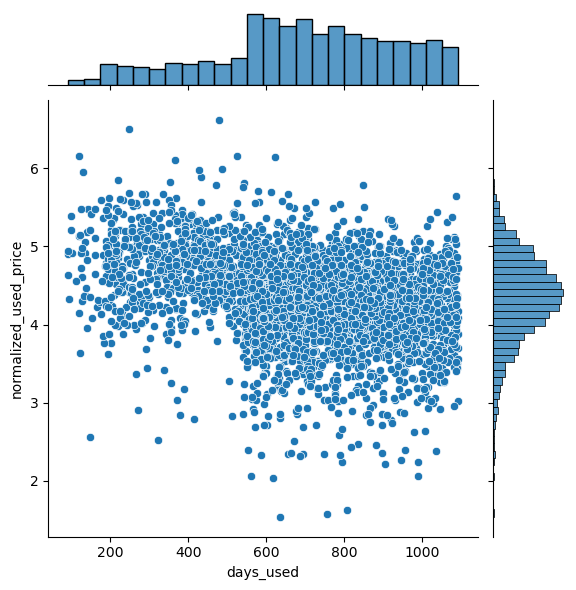

In [41]:
sb.jointplot(data=data, x='days_used', y='normalized_used_price')